In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
    print(os.path.join(dirname))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input
/kaggle/input/gan-getting-started
/kaggle/input/gan-getting-started/monet_jpg
/kaggle/input/gan-getting-started/photo_tfrec
/kaggle/input/gan-getting-started/photo_jpg
/kaggle/input/gan-getting-started/monet_tfrec


In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
import matplotlib.pyplot as plt
from PIL import Image

# Data Extraction

In [3]:
class TorchDataset(Dataset):
    def __init__(self, data_path, transform=None):
        self.data_path = data_path
        self.transform = transform
        self.image_paths = [os.path.join(data_path, file) for file in os.listdir(data_path) if file.endswith('.jpg')]
        
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

In [4]:
transforms = torchvision.transforms.Compose([
    torchvision.transforms.Resize((256,256)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [5]:
MonetDataset = TorchDataset(data_path='/kaggle/input/gan-getting-started/monet_jpg', transform=transforms)
PhotoDataset = TorchDataset(data_path='/kaggle/input/gan-getting-started/photo_jpg', transform=transforms)

MonetLoader = DataLoader(MonetDataset, batch_size=16, shuffle=True, num_workers=2)
PhotoLoader = DataLoader(PhotoDataset, batch_size=16, shuffle=True, num_workers=2)

# EDA

In [6]:
print(len(PhotoDataset), len(MonetDataset))

7038 300


In [7]:
monets = next(iter(MonetLoader))
photos = next(iter(PhotoLoader))
print(monets.shape, photos.shape)

torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


In [8]:
# tansform data to be readable by plt.imshow
monets_imshow = []
for monet in monets:
    monet = monet.permute(1, 2, 0) 
    monet = monet.numpy() 
    monet = monet * 0.5 + 0.5 
    monets_imshow.append(monet)

photos_imshow = []    
for photo in photos:
    photo = photo.permute(1, 2, 0) 
    photo = photo.numpy()
    photo = photo * 0.5 + 0.5
    photos_imshow.append(photo)

In [9]:
print(monets_imshow[3].shape) 
print(monets_imshow[3].dtype) 

(256, 256, 3)
float32


Monet


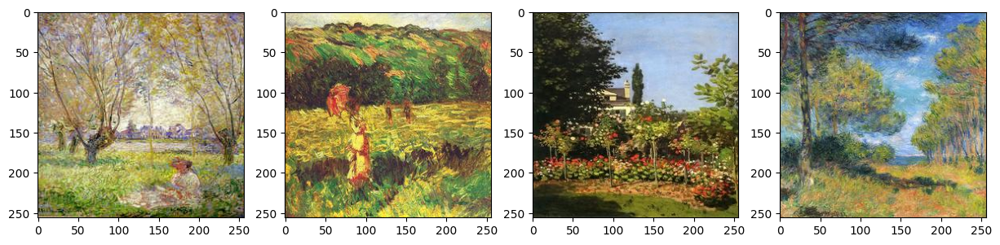

Photos


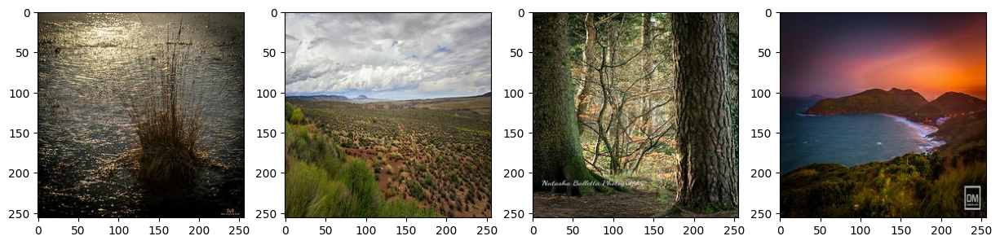

In [10]:
print('Monet')
plt.figure(figsize=(15, 5)) 
for i in range(4):
    plt.subplot(1, 4, i+1)  
    plt.imshow(monets_imshow[i])
plt.show()

print('Photos')
plt.figure(figsize=(15, 5)) 
for i in range(4):
    plt.subplot(1, 4, i+1)  
    plt.imshow(photos_imshow[i])
plt.show()

# Discriminator

In [11]:
import torch.nn as nn

class Block(nn.Module):
    def __init__(self, in_channels, out_channels, stride):
        super().__init__()
        self.cnn = nn.Sequential(
            # Convolution layer
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=4,
                stride=stride,
                padding=1,
                bias=True,
                padding_mode="reflect",
            ), 
            nn.InstanceNorm2d(out_channels), 
            nn.LeakyReLU(0.2, inplace=True), 
        )
    
    def forward(self, x):
        return self.cnn(x)

In [12]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2, inplace=True),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(
                Block(in_channels, feature, stride=1 if feature == features[-1] else 2)
            )
            in_channels = feature
        layers.append(
            nn.Conv2d(
                in_channels,
                1,
                kernel_size=4,
                stride=1,
                padding=1,
                padding_mode="reflect",
            )
        )
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial(x)
        return torch.sigmoid(self.model(x))

In [13]:
model_dis_test = Discriminator()

test_input = torch.randn((2, 3, 256, 256))

print(model_dis_test(test_input).shape)

torch.Size([2, 1, 30, 30])


# Generator

In [14]:
class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        
        if down:
            conv_layer = nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
        else:
            conv_layer = nn.ConvTranspose2d(in_channels, out_channels, **kwargs)
        
        if use_act:
            act_layer = nn.ReLU(inplace=True)
        else:
            act_layer = nn.Identity()
        
        self.cnn = nn.Sequential(
            conv_layer,
            nn.InstanceNorm2d(out_channels),
            act_layer,
        )

    def forward(self, x):
        return self.cnn(x)


class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            CNNBlock(channels, channels, kernel_size=3, padding=1),
            CNNBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        return x + self.block(x)

In [15]:
class Generator(nn.Module):
    def __init__(self, img_channels, num_features=64, num_residuals=9):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(
                img_channels,
                num_features,
                kernel_size=7,
                stride=1,
                padding=3,
                padding_mode="reflect",
            ),
            nn.InstanceNorm2d(num_features),
            nn.ReLU(inplace=True),
        )
        self.down_blocks = nn.ModuleList(
            [
                CNNBlock(
                    num_features, 
                    num_features * 2, 
                    kernel_size=3, 
                    stride=2, 
                    padding=1
                ),
                CNNBlock(
                    num_features * 2,
                    num_features * 4,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                ),
            ]
        )
        self.res_blocks = nn.Sequential(
            *[ResidualBlock(num_features * 4) for _ in range(num_residuals)]
        )
        self.up_blocks = nn.ModuleList(
            [
                CNNBlock(
                    num_features * 4,
                    num_features * 2,
                    down=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
                CNNBlock(
                    num_features * 2,
                    num_features * 1,
                    down=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
            ]
        )

        self.last = nn.Conv2d(
            num_features * 1,
            img_channels,
            kernel_size=7,
            stride=1,
            padding=3,
            padding_mode="reflect",
        )

    def forward(self, x):
        x = self.initial(x)
        for layer in self.down_blocks:
            x = layer(x)
        x = self.res_blocks(x)
        for layer in self.up_blocks:
            x = layer(x)
        return torch.tanh(self.last(x))

In [16]:
img_channels = 3
img_size = 256

test_input = torch.randn((2, img_channels, img_size, img_size))

model_gen_test = Generator(img_channels, 9)

print(model_gen_test(test_input).shape)

torch.Size([2, 3, 256, 256])


# Training

In [17]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


In [18]:
from torch.utils.data import random_split

val_size_monet = int(0.2 * len(MonetDataset))
train_size_monet = len(MonetDataset) - val_size_monet

val_size_photo = int(0.2 * len(PhotoDataset))
train_size_photo = len(PhotoDataset) - val_size_photo


train_MonetDataset, val_MonetDataset = random_split(MonetDataset, [train_size_monet, val_size_monet])
train_PhotoDataset, val_PhotoDataset = random_split(PhotoDataset, [train_size_photo, val_size_photo])

train_MonetLoader = DataLoader(train_MonetDataset, batch_size=16, shuffle=True, num_workers=2)
val_MonetLoader = DataLoader(val_MonetDataset, batch_size=16, shuffle=False, num_workers=2)

train_PhotoLoader = DataLoader(train_PhotoDataset, batch_size=16, shuffle=True, num_workers=2)
val_PhotoLoader = DataLoader(val_PhotoDataset, batch_size=16, shuffle=False, num_workers=2)

Epoch [1/100] - loss_G_Photo2Monet: 0.1222, loss_G_Monet2Photo: 2.3787, loss_D_Photo: 0.0101, loss_D_Monet: 0.2414
Epoch [2/100] - loss_G_Photo2Monet: 0.1093, loss_G_Monet2Photo: 2.1878, loss_D_Photo: 0.0094, loss_D_Monet: 0.2397
Epoch [3/100] - loss_G_Photo2Monet: 0.1100, loss_G_Monet2Photo: 2.1509, loss_D_Photo: 0.0091, loss_D_Monet: 0.2253
Epoch [4/100] - loss_G_Photo2Monet: 0.1127, loss_G_Monet2Photo: 2.2575, loss_D_Photo: 0.0083, loss_D_Monet: 0.2165
Epoch [5/100] - loss_G_Photo2Monet: 0.1153, loss_G_Monet2Photo: 2.3798, loss_D_Photo: 0.0083, loss_D_Monet: 0.2074
Epoch [6/100] - loss_G_Photo2Monet: 0.1201, loss_G_Monet2Photo: 2.4240, loss_D_Photo: 0.0079, loss_D_Monet: 0.2053
Epoch [7/100] - loss_G_Photo2Monet: 0.1230, loss_G_Monet2Photo: 2.4198, loss_D_Photo: 0.0075, loss_D_Monet: 0.1863
Epoch [8/100] - loss_G_Photo2Monet: 0.1262, loss_G_Monet2Photo: 2.4102, loss_D_Photo: 0.0076, loss_D_Monet: 0.1908
Epoch [9/100] - loss_G_Photo2Monet: 0.1243, loss_G_Monet2Photo: 2.3586, loss_D_P

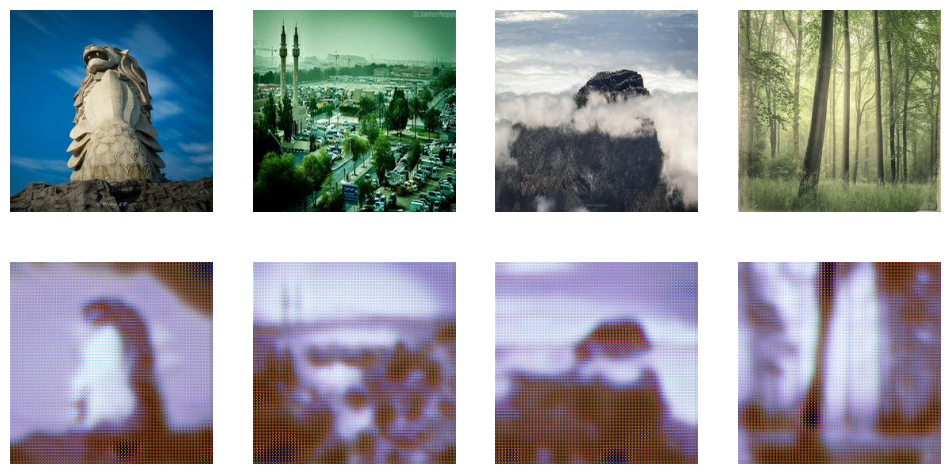

Epoch [11/100] - loss_G_Photo2Monet: 0.0996, loss_G_Monet2Photo: 2.0633, loss_D_Photo: 0.0087, loss_D_Monet: 0.2405
Epoch [12/100] - loss_G_Photo2Monet: 0.0933, loss_G_Monet2Photo: 2.0978, loss_D_Photo: 0.0089, loss_D_Monet: 0.2289
Epoch [13/100] - loss_G_Photo2Monet: 0.1016, loss_G_Monet2Photo: 2.2237, loss_D_Photo: 0.0073, loss_D_Monet: 0.2207
Epoch [14/100] - loss_G_Photo2Monet: 0.1096, loss_G_Monet2Photo: 2.3225, loss_D_Photo: 0.0060, loss_D_Monet: 0.2091
Epoch [15/100] - loss_G_Photo2Monet: 0.1108, loss_G_Monet2Photo: 2.1456, loss_D_Photo: 0.0058, loss_D_Monet: 0.2124
Epoch [16/100] - loss_G_Photo2Monet: 0.1120, loss_G_Monet2Photo: 2.2561, loss_D_Photo: 0.0055, loss_D_Monet: 0.1870
Epoch [17/100] - loss_G_Photo2Monet: 0.1084, loss_G_Monet2Photo: 2.4131, loss_D_Photo: 0.0067, loss_D_Monet: 0.1943
Epoch [18/100] - loss_G_Photo2Monet: 0.1101, loss_G_Monet2Photo: 2.2596, loss_D_Photo: 0.0098, loss_D_Monet: 0.2096
Epoch [19/100] - loss_G_Photo2Monet: 0.0918, loss_G_Monet2Photo: 2.0020,

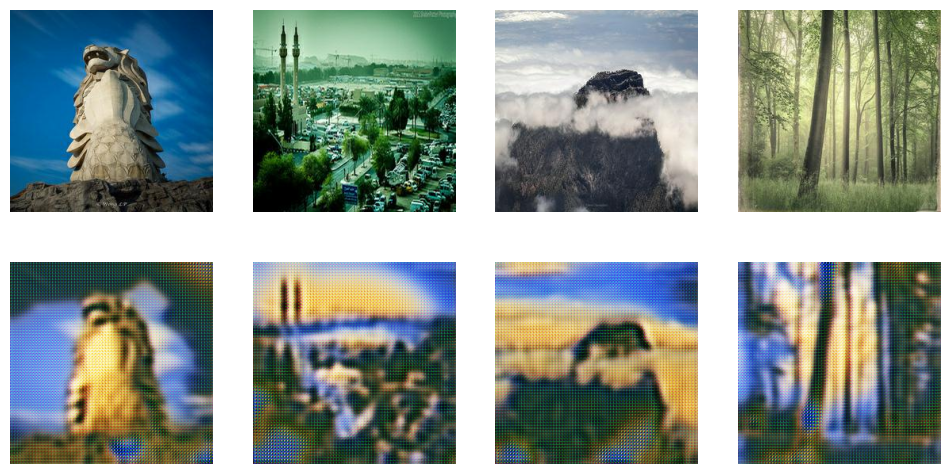

Epoch [21/100] - loss_G_Photo2Monet: 0.0973, loss_G_Monet2Photo: 1.9299, loss_D_Photo: 0.0083, loss_D_Monet: 0.2110
Epoch [22/100] - loss_G_Photo2Monet: 0.0860, loss_G_Monet2Photo: 1.9817, loss_D_Photo: 0.0102, loss_D_Monet: 0.2396
Epoch [23/100] - loss_G_Photo2Monet: 0.0914, loss_G_Monet2Photo: 1.8426, loss_D_Photo: 0.0103, loss_D_Monet: 0.2323
Epoch [24/100] - loss_G_Photo2Monet: 0.0851, loss_G_Monet2Photo: 1.7995, loss_D_Photo: 0.0100, loss_D_Monet: 0.2259
Epoch [25/100] - loss_G_Photo2Monet: 0.0872, loss_G_Monet2Photo: 1.7598, loss_D_Photo: 0.0098, loss_D_Monet: 0.2241
Epoch [26/100] - loss_G_Photo2Monet: 0.0814, loss_G_Monet2Photo: 1.7547, loss_D_Photo: 0.0098, loss_D_Monet: 0.2214
Epoch [27/100] - loss_G_Photo2Monet: 0.0793, loss_G_Monet2Photo: 1.7134, loss_D_Photo: 0.0100, loss_D_Monet: 0.2202
Epoch [28/100] - loss_G_Photo2Monet: 0.0859, loss_G_Monet2Photo: 1.7252, loss_D_Photo: 0.0100, loss_D_Monet: 0.2151
Epoch [29/100] - loss_G_Photo2Monet: 0.0805, loss_G_Monet2Photo: 1.7805,

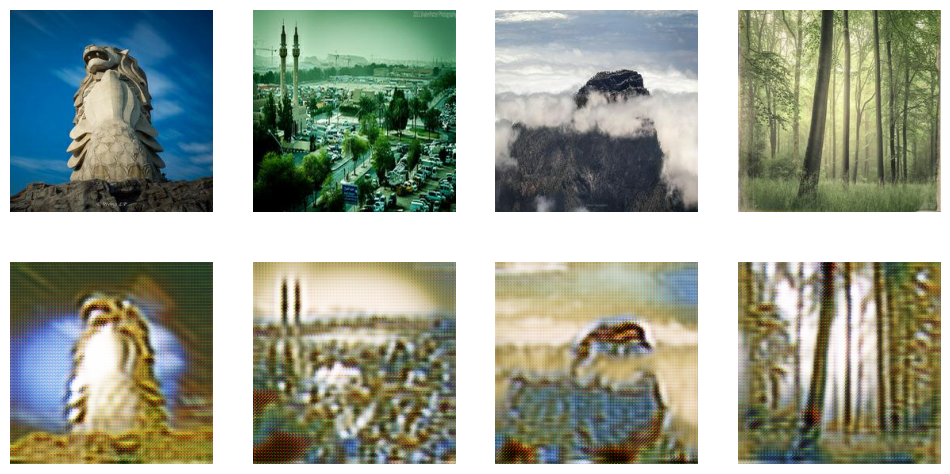

Epoch [31/100] - loss_G_Photo2Monet: 0.0828, loss_G_Monet2Photo: 1.7658, loss_D_Photo: 0.0087, loss_D_Monet: 0.2287
Epoch [32/100] - loss_G_Photo2Monet: 0.0818, loss_G_Monet2Photo: 1.6826, loss_D_Photo: 0.0091, loss_D_Monet: 0.2143
Epoch [33/100] - loss_G_Photo2Monet: 0.0758, loss_G_Monet2Photo: 1.7234, loss_D_Photo: 0.0091, loss_D_Monet: 0.2020
Epoch [34/100] - loss_G_Photo2Monet: 0.0754, loss_G_Monet2Photo: 1.6852, loss_D_Photo: 0.0091, loss_D_Monet: 0.1965
Epoch [35/100] - loss_G_Photo2Monet: 0.0795, loss_G_Monet2Photo: 1.6551, loss_D_Photo: 0.0089, loss_D_Monet: 0.1907
Epoch [36/100] - loss_G_Photo2Monet: 0.0747, loss_G_Monet2Photo: 1.6930, loss_D_Photo: 0.0089, loss_D_Monet: 0.2074
Epoch [37/100] - loss_G_Photo2Monet: 0.0748, loss_G_Monet2Photo: 1.7162, loss_D_Photo: 0.0085, loss_D_Monet: 0.1920
Epoch [38/100] - loss_G_Photo2Monet: 0.0735, loss_G_Monet2Photo: 1.7588, loss_D_Photo: 0.0083, loss_D_Monet: 0.1779
Epoch [39/100] - loss_G_Photo2Monet: 0.0739, loss_G_Monet2Photo: 1.7220,

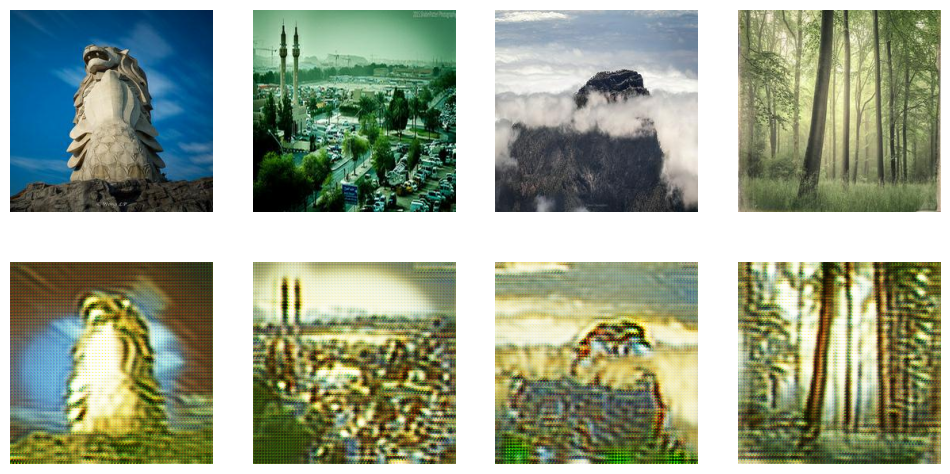

Epoch [41/100] - loss_G_Photo2Monet: 0.0794, loss_G_Monet2Photo: 1.6847, loss_D_Photo: 0.0084, loss_D_Monet: 0.1956
Epoch [42/100] - loss_G_Photo2Monet: 0.0770, loss_G_Monet2Photo: 1.6805, loss_D_Photo: 0.0090, loss_D_Monet: 0.2164
Epoch [43/100] - loss_G_Photo2Monet: 0.0822, loss_G_Monet2Photo: 1.6462, loss_D_Photo: 0.0083, loss_D_Monet: 0.1872
Epoch [44/100] - loss_G_Photo2Monet: 0.0779, loss_G_Monet2Photo: 1.6365, loss_D_Photo: 0.0089, loss_D_Monet: 0.1754
Epoch [45/100] - loss_G_Photo2Monet: 0.0763, loss_G_Monet2Photo: 1.5945, loss_D_Photo: 0.0090, loss_D_Monet: 0.1947
Epoch [46/100] - loss_G_Photo2Monet: 0.0812, loss_G_Monet2Photo: 1.6089, loss_D_Photo: 0.0092, loss_D_Monet: 0.1965
Epoch [47/100] - loss_G_Photo2Monet: 0.0715, loss_G_Monet2Photo: 1.5722, loss_D_Photo: 0.0099, loss_D_Monet: 0.1957
Epoch [48/100] - loss_G_Photo2Monet: 0.0795, loss_G_Monet2Photo: 1.6496, loss_D_Photo: 0.0092, loss_D_Monet: 0.1962
Epoch [49/100] - loss_G_Photo2Monet: 0.0773, loss_G_Monet2Photo: 1.5511,

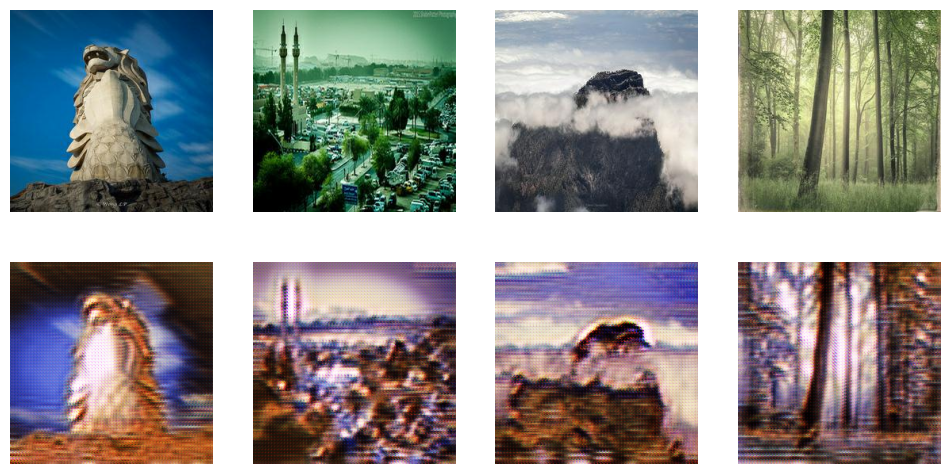

Epoch [51/100] - loss_G_Photo2Monet: 0.0754, loss_G_Monet2Photo: 1.5769, loss_D_Photo: 0.0095, loss_D_Monet: 0.1892
Epoch [52/100] - loss_G_Photo2Monet: 0.0746, loss_G_Monet2Photo: 1.5640, loss_D_Photo: 0.0094, loss_D_Monet: 0.1798
Epoch [53/100] - loss_G_Photo2Monet: 0.0800, loss_G_Monet2Photo: 1.6207, loss_D_Photo: 0.0089, loss_D_Monet: 0.1725
Epoch [54/100] - loss_G_Photo2Monet: 0.0773, loss_G_Monet2Photo: 1.5911, loss_D_Photo: 0.0093, loss_D_Monet: 0.1877
Epoch [55/100] - loss_G_Photo2Monet: 0.0753, loss_G_Monet2Photo: 1.5155, loss_D_Photo: 0.0096, loss_D_Monet: 0.1954
Epoch [56/100] - loss_G_Photo2Monet: 0.0749, loss_G_Monet2Photo: 1.5264, loss_D_Photo: 0.0095, loss_D_Monet: 0.2116
Epoch [57/100] - loss_G_Photo2Monet: 0.0721, loss_G_Monet2Photo: 1.5593, loss_D_Photo: 0.0095, loss_D_Monet: 0.1946
Epoch [58/100] - loss_G_Photo2Monet: 0.0729, loss_G_Monet2Photo: 1.5501, loss_D_Photo: 0.0093, loss_D_Monet: 0.1971
Epoch [59/100] - loss_G_Photo2Monet: 0.0689, loss_G_Monet2Photo: 1.5261,

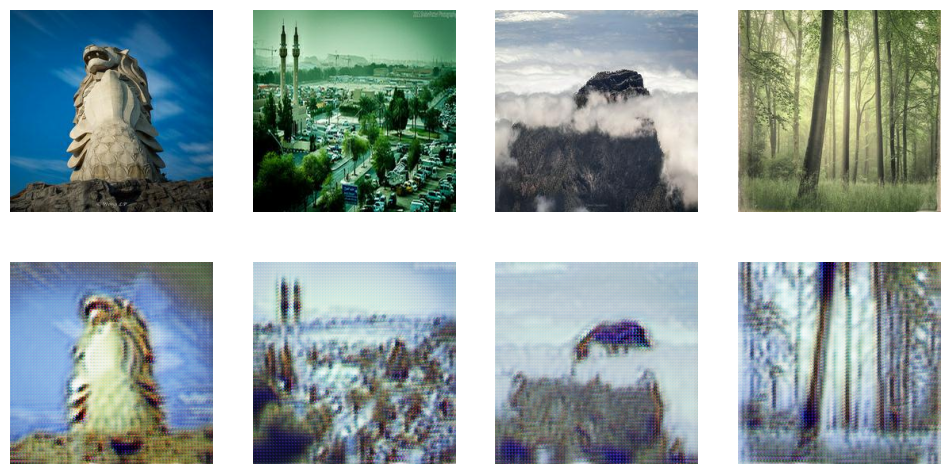

Epoch [61/100] - loss_G_Photo2Monet: 0.0698, loss_G_Monet2Photo: 1.5081, loss_D_Photo: 0.0096, loss_D_Monet: 0.2048
Epoch [62/100] - loss_G_Photo2Monet: 0.0786, loss_G_Monet2Photo: 1.6616, loss_D_Photo: 0.0086, loss_D_Monet: 0.2007
Epoch [63/100] - loss_G_Photo2Monet: 0.0728, loss_G_Monet2Photo: 1.5231, loss_D_Photo: 0.0097, loss_D_Monet: 0.2133
Epoch [64/100] - loss_G_Photo2Monet: 0.0734, loss_G_Monet2Photo: 1.4814, loss_D_Photo: 0.0095, loss_D_Monet: 0.1984
Epoch [65/100] - loss_G_Photo2Monet: 0.0704, loss_G_Monet2Photo: 1.5240, loss_D_Photo: 0.0094, loss_D_Monet: 0.2137
Epoch [66/100] - loss_G_Photo2Monet: 0.0740, loss_G_Monet2Photo: 1.5678, loss_D_Photo: 0.0098, loss_D_Monet: 0.2136
Epoch [67/100] - loss_G_Photo2Monet: 0.0720, loss_G_Monet2Photo: 1.4989, loss_D_Photo: 0.0100, loss_D_Monet: 0.2101
Epoch [68/100] - loss_G_Photo2Monet: 0.0726, loss_G_Monet2Photo: 1.4922, loss_D_Photo: 0.0093, loss_D_Monet: 0.2036
Epoch [69/100] - loss_G_Photo2Monet: 0.0798, loss_G_Monet2Photo: 1.6340,

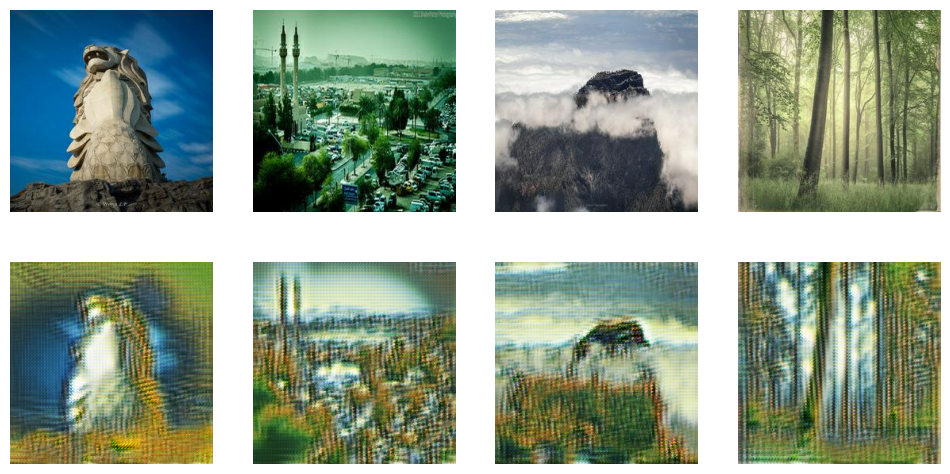

Epoch [71/100] - loss_G_Photo2Monet: 0.0755, loss_G_Monet2Photo: 1.5551, loss_D_Photo: 0.0094, loss_D_Monet: 0.2068
Epoch [72/100] - loss_G_Photo2Monet: 0.0734, loss_G_Monet2Photo: 1.5198, loss_D_Photo: 0.0099, loss_D_Monet: 0.2025
Epoch [73/100] - loss_G_Photo2Monet: 0.0754, loss_G_Monet2Photo: 1.5048, loss_D_Photo: 0.0095, loss_D_Monet: 0.1992
Epoch [74/100] - loss_G_Photo2Monet: 0.0758, loss_G_Monet2Photo: 1.5073, loss_D_Photo: 0.0093, loss_D_Monet: 0.1986
Epoch [75/100] - loss_G_Photo2Monet: 0.0768, loss_G_Monet2Photo: 1.5489, loss_D_Photo: 0.0093, loss_D_Monet: 0.1994
Epoch [76/100] - loss_G_Photo2Monet: 0.0734, loss_G_Monet2Photo: 1.4884, loss_D_Photo: 0.0100, loss_D_Monet: 0.1969
Epoch [77/100] - loss_G_Photo2Monet: 0.0722, loss_G_Monet2Photo: 1.4537, loss_D_Photo: 0.0091, loss_D_Monet: 0.1984
Epoch [78/100] - loss_G_Photo2Monet: 0.0722, loss_G_Monet2Photo: 1.4556, loss_D_Photo: 0.0091, loss_D_Monet: 0.2079
Epoch [79/100] - loss_G_Photo2Monet: 0.0742, loss_G_Monet2Photo: 1.4924,

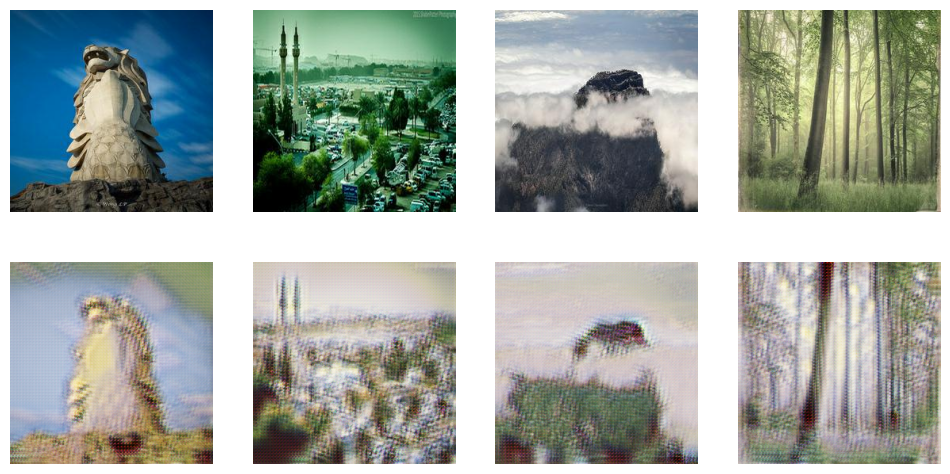

Epoch [81/100] - loss_G_Photo2Monet: 0.0706, loss_G_Monet2Photo: 1.4594, loss_D_Photo: 0.0093, loss_D_Monet: 0.2052
Epoch [82/100] - loss_G_Photo2Monet: 0.0710, loss_G_Monet2Photo: 1.5401, loss_D_Photo: 0.0089, loss_D_Monet: 0.2058
Epoch [83/100] - loss_G_Photo2Monet: 0.0673, loss_G_Monet2Photo: 1.4630, loss_D_Photo: 0.0094, loss_D_Monet: 0.2193
Epoch [84/100] - loss_G_Photo2Monet: 0.0735, loss_G_Monet2Photo: 1.4733, loss_D_Photo: 0.0095, loss_D_Monet: 0.1994
Epoch [85/100] - loss_G_Photo2Monet: 0.0742, loss_G_Monet2Photo: 1.5224, loss_D_Photo: 0.0095, loss_D_Monet: 0.2071
Epoch [86/100] - loss_G_Photo2Monet: 0.0712, loss_G_Monet2Photo: 1.4498, loss_D_Photo: 0.0098, loss_D_Monet: 0.2360
Epoch [87/100] - loss_G_Photo2Monet: 0.0696, loss_G_Monet2Photo: 1.5130, loss_D_Photo: 0.0094, loss_D_Monet: 0.2200
Epoch [88/100] - loss_G_Photo2Monet: 0.0728, loss_G_Monet2Photo: 1.4826, loss_D_Photo: 0.0093, loss_D_Monet: 0.2235
Epoch [89/100] - loss_G_Photo2Monet: 0.0726, loss_G_Monet2Photo: 1.5392,

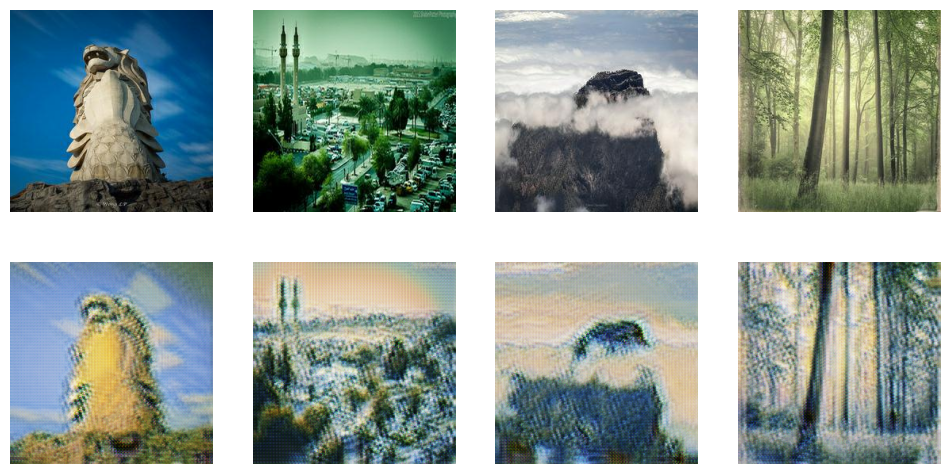

Epoch [91/100] - loss_G_Photo2Monet: 0.0693, loss_G_Monet2Photo: 1.4144, loss_D_Photo: 0.0096, loss_D_Monet: 0.2102
Epoch [92/100] - loss_G_Photo2Monet: 0.0682, loss_G_Monet2Photo: 1.4142, loss_D_Photo: 0.0090, loss_D_Monet: 0.2073
Epoch [93/100] - loss_G_Photo2Monet: 0.0713, loss_G_Monet2Photo: 1.4808, loss_D_Photo: 0.0098, loss_D_Monet: 0.2122
Epoch [94/100] - loss_G_Photo2Monet: 0.0714, loss_G_Monet2Photo: 1.4789, loss_D_Photo: 0.0097, loss_D_Monet: 0.2161
Epoch [95/100] - loss_G_Photo2Monet: 0.0688, loss_G_Monet2Photo: 1.4931, loss_D_Photo: 0.0088, loss_D_Monet: 0.2121
Epoch [96/100] - loss_G_Photo2Monet: 0.0702, loss_G_Monet2Photo: 1.4485, loss_D_Photo: 0.0100, loss_D_Monet: 0.2281
Epoch [97/100] - loss_G_Photo2Monet: 0.0752, loss_G_Monet2Photo: 1.4770, loss_D_Photo: 0.0095, loss_D_Monet: 0.2267
Epoch [98/100] - loss_G_Photo2Monet: 0.0699, loss_G_Monet2Photo: 1.4466, loss_D_Photo: 0.0089, loss_D_Monet: 0.2073
Epoch [99/100] - loss_G_Photo2Monet: 0.0667, loss_G_Monet2Photo: 1.4876,

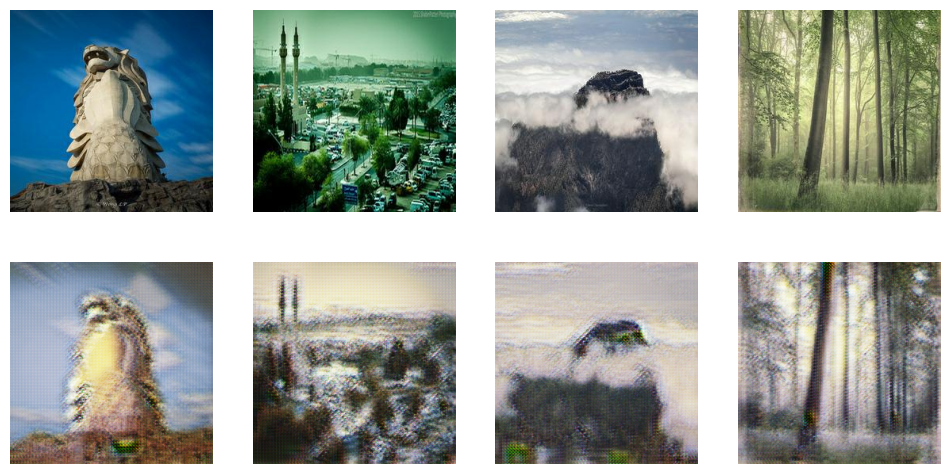

In [19]:
import torch.optim as optim
from torch.cuda.amp import GradScaler, autocast
from tqdm import tqdm

device = "cuda" if torch.cuda.is_available() else "cpu"
G_Photo2Monet = Generator(img_channels=3).to(device)
G_Monet2Photo = Generator(img_channels=3).to(device)
D_Photo = Discriminator(in_channels=3).to(device)
D_Monet = Discriminator(in_channels=3).to(device)

optimizer_G_Photo2Monet = optim.Adam(G_Photo2Monet.parameters(), lr=1e-4, betas=(0.5, 0.5))
optimizer_G_Monet2Photo = optim.Adam(G_Monet2Photo.parameters(), lr=1e-4, betas=(0.5, 0.5))
optimizer_D_Photo = optim.Adam(D_Photo.parameters(), lr=1e-4, betas=(0.5, 0.5))
optimizer_D_Monet = optim.Adam(D_Monet.parameters(), lr=1e-4, betas=(0.5, 0.5))

criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()

scaler = GradScaler()

lambda_cycle = 5
num_epochs = 100
batch_size = 16

for epoch in range(num_epochs):
    epoch_loss_G_Photo2Monet = 0
    epoch_loss_G_Monet2Photo = 0
    epoch_loss_D_Photo = 0
    epoch_loss_D_Monet = 0
    
    for i, (real_photo, real_monet) in enumerate(zip(train_PhotoLoader, train_MonetLoader)):
        real_photo = real_photo.to(device)
        real_monet = real_monet.to(device)
        batch_size = real_photo.size(0)

        fake_monet = G_Photo2Monet(real_photo).detach()
        fake_photo = G_Monet2Photo(real_monet).detach()

        D_Photo_real = D_Photo(real_photo)
        D_Monet_real = D_Monet(real_monet)
        D_Photo_output_shape = D_Photo_real.shape
        D_Monet_output_shape = D_Monet_real.shape

        real_label_Photo = torch.ones(D_Photo_output_shape, dtype=torch.float, device=device)
        fake_label_Photo = torch.zeros(D_Photo_output_shape, dtype=torch.float, device=device)
        real_label_Monet = torch.ones(D_Monet_output_shape, dtype=torch.float, device=device)
        fake_label_Monet = torch.zeros(D_Monet_output_shape, dtype=torch.float, device=device)

        with autocast():
            D_Photo_real = D_Photo(real_photo)
            D_Photo_fake = D_Photo(fake_photo)
            loss_D_Photo_real = criterion_GAN(D_Photo_real, real_label_Photo)
            loss_D_Photo_fake = criterion_GAN(D_Photo_fake, fake_label_Photo)
            loss_D_Photo = (loss_D_Photo_real + loss_D_Photo_fake) * 0.5

            D_Monet_real = D_Monet(real_monet)
            D_Monet_fake = D_Monet(fake_monet)
            loss_D_Monet_real = criterion_GAN(D_Monet_real, real_label_Monet)
            loss_D_Monet_fake = criterion_GAN(D_Monet_fake, fake_label_Monet)
            loss_D_Monet = (loss_D_Monet_real + loss_D_Monet_fake) * 0.5

        optimizer_D_Photo.zero_grad()
        scaler.scale(loss_D_Photo).backward()
        scaler.step(optimizer_D_Photo)

        optimizer_D_Monet.zero_grad()
        scaler.scale(loss_D_Monet).backward()
        scaler.step(optimizer_D_Monet)

        epoch_loss_D_Photo += loss_D_Photo.item()
        epoch_loss_D_Monet += loss_D_Monet.item()

        with autocast():
            fake_monet = G_Photo2Monet(real_photo)
            fake_photo = G_Monet2Photo(real_monet)
            loss_GAN_Photo2Monet = criterion_GAN(D_Monet(fake_monet), real_label_Monet)
            loss_GAN_Monet2Photo = criterion_GAN(D_Photo(fake_photo), real_label_Photo)

            cycle_photo = G_Monet2Photo(fake_monet)
            cycle_monet = G_Photo2Monet(fake_photo)
            loss_cycle_photo = criterion_cycle(cycle_photo, real_photo)
            loss_cycle_monet = criterion_cycle(cycle_monet, real_monet)

            loss_G_Photo2Monet = loss_GAN_Photo2Monet + lambda_cycle * loss_cycle_photo
            loss_G_Monet2Photo = loss_GAN_Monet2Photo + lambda_cycle * loss_cycle_monet

        optimizer_G_Photo2Monet.zero_grad()
        scaler.scale(loss_G_Photo2Monet).backward()
        scaler.step(optimizer_G_Photo2Monet)

        optimizer_G_Monet2Photo.zero_grad()
        scaler.scale(loss_G_Monet2Photo).backward()
        scaler.step(optimizer_G_Monet2Photo)

        scaler.update()

        epoch_loss_G_Photo2Monet += loss_G_Photo2Monet.item()
        epoch_loss_G_Monet2Photo += loss_G_Monet2Photo.item()

    epoch_loss_G_Photo2Monet /= len(train_PhotoLoader)
    epoch_loss_G_Monet2Photo /= len(train_MonetLoader)
    epoch_loss_D_Photo /= len(train_PhotoLoader)
    epoch_loss_D_Monet /= len(train_MonetLoader)

    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"loss_G_Photo2Monet: {epoch_loss_G_Photo2Monet:.4f}, "
          f"loss_G_Monet2Photo: {epoch_loss_G_Monet2Photo:.4f}, "
          f"loss_D_Photo: {epoch_loss_D_Photo:.4f}, "
          f"loss_D_Monet: {epoch_loss_D_Monet:.4f}")

    if (epoch + 1) % 10 == 0:
        with torch.no_grad():
            G_Photo2Monet.eval()
            example_photo = next(iter(val_PhotoLoader)).to(device)
            fake_monet = G_Photo2Monet(example_photo)

            plt.figure(figsize=(12, 6))
            for i in range(4):
                plt.subplot(2, 4, i + 1)
                plt.imshow(((example_photo[i].cpu().numpy().transpose(1, 2, 0) + 1) / 2))
                plt.axis('off')
                plt.subplot(2, 4, i + 5)
                plt.imshow(((fake_monet[i].cpu().numpy().transpose(1, 2, 0) + 1) / 2))
                plt.axis('off')
            plt.show()

            G_Photo2Monet.train()

final_model_path = 'final_model.pth'
torch.save({
    'G_Photo2Monet': G_Photo2Monet.state_dict(),
    'G_Monet2Photo': G_Monet2Photo.state_dict(),
    'D_Photo': D_Photo.state_dict(),
    'D_Monet': D_Monet.state_dict(),
    'optimizer_G_Photo2Monet': optimizer_G_Photo2Monet.state_dict(),
    'optimizer_G_Monet2Photo': optimizer_G_Monet2Photo.state_dict(),
    'optimizer_D_Photo': optimizer_D_Photo.state_dict(),
    'optimizer_D_Monet': optimizer_D_Monet.state_dict(),
}, final_model_path)

In [20]:
import shutil
from zipfile import ZipFile

device = "cuda" if torch.cuda.is_available() else "cpu"
model_path = '/kaggle/working/final_model.pth'
checkpoint = torch.load(model_path)


G_Photo2Monet = Generator(img_channels=3).to(device)
G_Photo2Monet.load_state_dict(checkpoint['G_Photo2Monet'])
G_Photo2Monet.eval()

test_loader = DataLoader(PhotoDataset, batch_size=1, shuffle=False)


os.makedirs('../tmp/images', exist_ok=True)

with torch.no_grad():
    for i, img in enumerate(test_loader):
        img = img.to(device)
        fake_monet = G_Photo2Monet(img)[0].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
        im = Image.fromarray((fake_monet * 255).astype(np.uint8))
        im.save(f"../tmp/images/{i}.jpg")

output_zip_path = "/kaggle/working/images.zip"
with ZipFile(output_zip_path, 'w') as zipf:
    for root, _, files in os.walk('../tmp/images'):
        for file in files:
            zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), '../tmp/images'))
